Implemented from Paper -> [link](https://arxiv.org/abs/1703.10593)

In [1]:
!nproc

2


In [2]:
!nvidia-smi

Wed Apr 26 17:46:15 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.161.03   Driver Version: 470.161.03   CUDA Version: 11.4     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla P100-PCIE...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0    26W / 250W |      0MiB / 16280MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
import os
import tensorflow as tf

os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"
physical_devices = tf.config.list_physical_devices("GPU")
physical_devices

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

In [4]:
tf.test.is_built_with_cuda()

True

In [5]:
from tensorflow import keras
import numpy as np
from matplotlib import pyplot as plt
from tensorflow_addons.layers import InstanceNormalization

In [6]:
PATH_SYN = '/kaggle/input/haze1k/Haze1k/Haze1k_moderate/dataset/'
PATH_NST = '/kaggle/input/nst-haze/NST-Haze/'
PATH = PATH_NST

In [7]:
os.listdir(PATH+'train')

['input', 'target']

In [8]:
from tensorflow.keras.preprocessing.image import img_to_array, load_img

from PIL import Image, ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

### Limiting the images due to computational overhead.

In [9]:
def load_images(path, size=(256,256)):
    data_list = list()
    files = os.listdir(path)
    files.sort()
    for i, filename in enumerate(files):
        if i==100:
            return np.asarray(data_list)
        pixels = load_img(path + str(filename), target_size=size)
        pixels = img_to_array(pixels)
        data_list.append(pixels)
    return np.asarray(data_list)

## Loading the data

In [10]:
haze_inp = load_images(PATH + 'train/input/')
haze_tar = load_images(PATH + 'train/target/')

print(haze_inp.shape)
print(haze_tar.shape)

filename = 'haze_nn_dataset.npz'
np.savez_compressed(filename, haze_inp, haze_tar)
print('Saved dataset: ', filename)

(100, 256, 256, 3)
(100, 256, 256, 3)
Saved dataset:  haze_nn_dataset.npz


Loaded:  (100, 256, 256, 3) (100, 256, 256, 3)


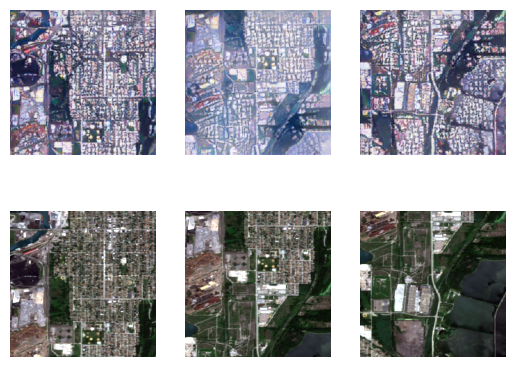

In [11]:
data = np.load('haze_nn_dataset.npz')
inp, target = data['arr_0'], data['arr_1']
print('Loaded: ', inp.shape, target.shape)
# plot source images
n_samples = 3


for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + i)
    plt.axis('off')
    plt.imshow(inp[i].astype('uint8'))

for i in range(n_samples):
    plt.subplot(2, n_samples, 1 + n_samples + i)
    plt.axis('off')
    plt.imshow(target[i].astype('uint8'))
plt.show()

## Defining the Arch

In [12]:
from keras.initializers import RandomNormal
from keras.layers import Conv2D, LeakyReLU, Activation, Concatenate, Conv2DTranspose
from keras import Model, Input
from keras.optimizers import Adam
from tensorflow import expand_dims

In [13]:
# define the discriminator model
def disciminator(image_shape):
 
    init = RandomNormal(stddev=0.02, seed=123)
    in_image = Input(shape=image_shape)

    d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(in_image)
    d = LeakyReLU(alpha=0.2)(d)

    d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)

    d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)

    d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)

    d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
    d = InstanceNormalization(axis=-1)(d)
    d = LeakyReLU(alpha=0.2)(d)

    patch_out = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)

    model = Model(in_image, patch_out)

    model.compile(loss='mse', optimizer=Adam(learning_rate=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model


In [14]:
def resnet_block(n_filters, input_layer):
 
    init = RandomNormal(stddev=0.02, seed=123)

    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(input_layer)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    g = Conv2D(n_filters, (3,3), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    # concatenate 
    g = Concatenate()([g, input_layer])
    return g

In [15]:
def generator(image_shape, n_resnet=9):
 
    init = RandomNormal(stddev=0.02, seed=123)
    # image input
    in_image = Input(shape=image_shape)

    g = Conv2D(64, (7,7), padding='same', kernel_initializer=init)(in_image)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    g = Conv2D(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    g = Conv2D(256, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    for _ in range(n_resnet):
        g = resnet_block(256, g)

    g = Conv2DTranspose(128, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    g = Conv2DTranspose(64, (3,3), strides=(2,2), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    g = Activation('relu')(g)

    g = Conv2D(3, (7,7), padding='same', kernel_initializer=init)(g)
    g = InstanceNormalization(axis=-1)(g)
    out_image = Activation('tanh')(g)

    model = Model(in_image, out_image)
    return model

In [16]:
def cycle_gan(g_model_1, d_model, g_model_2, image_shape):

    g_model_1.trainable = True
    d_model.trainable = False
    g_model_2.trainable = False

    input_gen = Input(shape=image_shape)
    gen1_out = g_model_1(input_gen)
    output_d = d_model(gen1_out)

    input_id = Input(shape=image_shape)
    output_id = g_model_1(input_id)

    output_f = g_model_2(gen1_out)

    gen2_out = g_model_2(input_id)
    output_b = g_model_1(gen2_out)

    model = Model([input_gen, input_id], [output_d, output_id, output_f, output_b])

    opt = Adam(learning_rate=0.0002, beta_1=0.5)

    model.compile(loss=['mse', 'mae', 'mae', 'mae'], loss_weights=[1, 5, 10, 10], optimizer=opt)
    return model

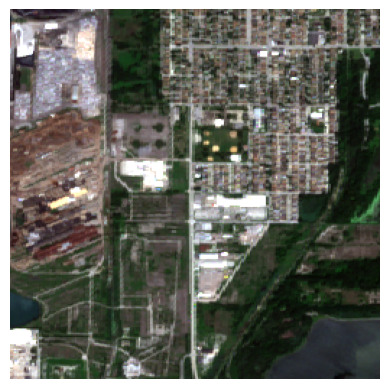

In [17]:
df = np.load('haze_nn_dataset.npz')
plt.imshow(df['arr_1'][1].astype('uint64'))
plt.axis('off')
plt.show()

In [18]:
def load_real_samples(filename):
 
    data = np.load(filename)
    X1, X2 = data['arr_0'], data['arr_1']
    X1 = (X1 - 127.5) / 127.5
    X2 = (X2 - 127.5) / 127.5
    return [X1, X2]

In [19]:
def generate_real_samples(dataset, n_samples, patch_shape):
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    y = np.ones((n_samples, patch_shape, patch_shape, 1))
    return X, y

In [20]:
def generate_fake_samples(g_model, dataset, patch_shape):
    X = g_model.predict(dataset)
    y = np.zeros((len(X), patch_shape, patch_shape, 1))
    return X, y

In [21]:
def save_models(step, g_model_HtoC, g_model_CtoH):
    filename1 = 'g_model_HtoC_%06d.h5' % (step+1)
    g_model_HtoC.save(filename1)
    filename2 = 'g_model_CtoH_%06d.h5' % (step+1)
    g_model_CtoH.save(filename2)
    print('Saved: {} and {}'.format(filename1, filename2))

In [22]:
def summarize_performance(step, g_model, trainX, name, n_samples=5):
    X_in, _ = generate_real_samples(trainX, n_samples, 0)
    X_out, _ = generate_fake_samples(g_model, X_in, 0)
    # scale all pixels from [-1,1] to [0,1]
    X_in = (X_in + 1) / 2.0
    X_out = (X_out + 1) / 2.0

    
    for i in range(n_samples):
        plt.subplot(2, n_samples, 1 + i)
        plt.axis('off')
        plt.imshow(X_in[i])
 
    for i in range(n_samples):
        plt.subplot(2, n_samples, 1 + n_samples + i)
        plt.axis('off')
        plt.imshow(X_out[i])
 
    filename1 = '%s_generated_plot_%06d.png' % (name, (step+1))
    plt.savefig(filename1)
    plt.close()

In [23]:
import random
def update_image_pool(pool, images, max_size=50):
    selected = list()
    for image in images:
        if len(pool) < max_size:
            # stock the pool
            pool.append(image)
            selected.append(image)
        elif random.random() < 0.5:
            selected.append(image)
        else:
            ix = np.random.randint(0, len(pool))
            selected.append(pool[ix])
            pool[ix] = image
    return np.asarray(selected)

## Training
- H -> Haze
- C -> Clear

In [24]:
def train(d_model_H, d_model_C, g_model_HtoC, g_model_CtoH, c_model_HtoC, c_model_CtoH, dataset):
 
    n_epochs, n_batch, = 100, 1
    n_patch = d_model_H.output_shape[1]
    # unpack dataset
    trainH, trainC = dataset

    poolH, poolC = list(), list()
    bat_per_epo = int(len(trainH) / n_batch)
    n_steps = bat_per_epo * n_epochs
    for i in range(n_steps):
        X_realH, y_realH = generate_real_samples(trainH, n_batch, n_patch)
        X_realC, y_realC = generate_real_samples(trainC, n_batch, n_patch)
        
        X_fakeH, y_fakeH = generate_fake_samples(g_model_CtoH, X_realC, n_patch)
        X_fakeC, y_fakeC = generate_fake_samples(g_model_HtoC, X_realH, n_patch)
        
        X_fakeH = update_image_pool(poolH, X_fakeH)
        X_fakeC = update_image_pool(poolC, X_fakeC)
        
        g_loss2, _, _, _, _  = c_model_CtoH.train_on_batch([X_realC, X_realH], [y_realH, X_realH, X_realC, X_realH])
        
        dH_loss1 = d_model_H.train_on_batch(X_realH, y_realH)
        dH_loss2 = d_model_H.train_on_batch(X_fakeH, y_fakeH)
        
        g_loss1, _, _, _, _ = c_model_HtoC.train_on_batch([X_realH, X_realC], [y_realC, X_realC, X_realH, X_realC])
        
        dC_loss1 = d_model_C.train_on_batch(X_realC, y_realC)
        dC_loss2 = d_model_C.train_on_batch(X_fakeC, y_fakeC)
        

        print('%d, dH[%.3f,%.3f] dC[%.3f,%.3f] g[%.3f,%.3f]' % (i+1, dH_loss1,dH_loss2, dC_loss1,dC_loss2, g_loss1,g_loss2))

        if (i+1) % (bat_per_epo * 1) == 0:
            summarize_performance(i, g_model_HtoC, trainH, 'HtoC')
            summarize_performance(i, g_model_CtoH, trainC, 'CtoH')
        if (i+1) % (bat_per_epo * 5) == 0:
            save_models(i, g_model_HtoC, g_model_CtoH)

In [25]:
dataset = load_real_samples('haze_nn_dataset.npz')
print('Loaded', dataset[0].shape, dataset[1].shape)
image_shape = dataset[0].shape[1:]

g_model_HtoC = generator(image_shape)
g_model_CtoH = generator(image_shape)

d_model_H = disciminator(image_shape)
d_model_C = disciminator(image_shape)

c_model_HtoC = cycle_gan(g_model_HtoC, d_model_C, g_model_CtoH, image_shape)
c_model_CtoH = cycle_gan(g_model_CtoH, d_model_H, g_model_HtoC, image_shape)

Loaded (100, 256, 256, 3) (100, 256, 256, 3)


In [26]:
%%time
train(d_model_H, d_model_C, g_model_HtoC, g_model_CtoH, c_model_HtoC, c_model_CtoH, dataset)

1/1 [==============================] - 1s 1s/step
1, dH[1.766,0.621] dC[1.890,0.825] g[20.237,19.869]
1/1 [==============================] - 0s 25ms/step
2, dH[1.469,0.763] dC[1.917,0.871] g[17.897,17.697]
1/1 [==============================] - 0s 27ms/step
3, dH[3.643,1.099] dC[1.709,1.373] g[18.416,17.522]
1/1 [==============================] - 0s 25ms/step
4, dH[1.566,0.932] dC[1.487,0.842] g[16.569,18.981]
1/1 [==============================] - 0s 26ms/step
5, dH[2.887,3.674] dC[2.749,0.991] g[15.631,22.128]
1/1 [==============================] - 0s 24ms/step
6, dH[1.914,5.620] dC[1.950,1.529] g[15.349,18.922]
1/1 [==============================] - 0s 25ms/step
7, dH[1.792,7.500] dC[1.994,3.139] g[15.938,19.426]
1/1 [==============================] - 0s 26ms/step
8, dH[1.063,3.714] dC[1.322,5.052] g[14.610,14.085]
1/1 [==============================] - 0s 26ms/step
9, dH[0.757,1.410] dC[0.689,1.259] g[12.490,13.390]
1/1 [==============================] - 0s 25ms/step
10, dH[0.740,1

In [27]:
H_data, C_data = load_real_samples('haze_nn_dataset.npz')
print('Loaded', H_data.shape, C_data.shape)

Loaded (100, 256, 256, 3) (100, 256, 256, 3)


In [28]:
#  save_models(0, g_model_HtoC, g_model_CtoH)

In [29]:
OP_PATH = '/kaggle/working/'
def finer_model(prefix):
    op_files = os.listdir(OP_PATH)

    op_files = list(filter(lambda file : file.startswith(prefix), op_files))
    op_files = list(map(lambda file : file[len(prefix): (len(prefix)+6)], op_files))
    op_files = list(map(lambda num : int(num), op_files))
    highest = max(op_files)
    print('Loaded {} steps model'.format(highest))
    return '{}{}{:06d}.h5'.format(OP_PATH,prefix,(highest))

In [30]:
cust = {'InstanceNormalization': InstanceNormalization}
model_HtoC = keras.models.load_model(finer_model('g_model_HtoC_'), cust)
model_CtoH = keras.models.load_model(finer_model('g_model_CtoH_'), cust)

Loaded 10000 steps model
Loaded 10000 steps model


In [31]:
def select_sample(dataset, n_samples):
    ix = np.random.randint(0, dataset.shape[0], n_samples)
    X = dataset[ix]
    return X

In [32]:
H_real = select_sample(H_data, 1)
C_generated  = model_HtoC.predict(H_real)
H_reconstructed = model_CtoH.predict(C_generated)

1/1 [==============================] - 1s 1s/step


In [33]:
def show_plot(imagesX, imagesY1, imagesY2):
    images = np.vstack((imagesX, imagesY1, imagesY2))
    titles = ['Real', 'Generated', 'Reconstructed']

    images = (images + 1) / 2.0
    for i in range(len(images)):
        plt.subplot(1, len(images), 1 + i)
        plt.axis('off')
        plt.imshow(images[i])
        plt.title(titles[i])
        plt.show()

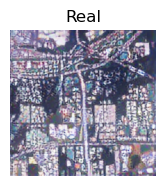

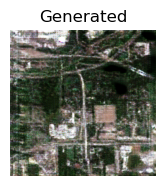

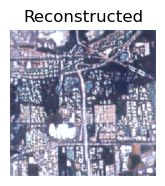

In [34]:
show_plot(H_real, C_generated, H_reconstructed)

In [35]:
def load_image(filename, size=(256,256)):
    pixels = load_img(filename, target_size=size)
    pixels = img_to_array(pixels)
    pixels = expand_dims(pixels, 0)
    pixels = (pixels - 127.5) / 127.5
    return pixels

In [36]:
from keras.models import load_model

In [37]:
image_src = load_image(PATH + 'test/input/001.png')

1/1 [==============================] - 0s 25ms/step


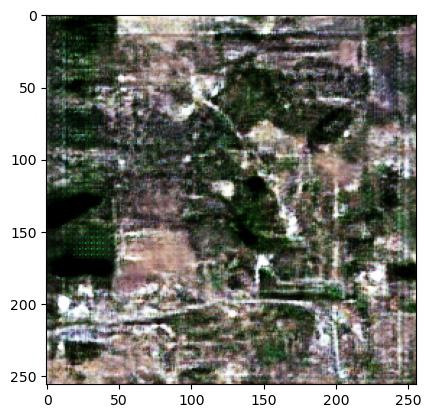

In [38]:
image_tar = model_HtoC.predict(image_src)
image_tar = (image_tar + 1) / 2.0
plt.imshow(image_tar[0])
plt.show()

## Finding the image quality assessment.

In [39]:
def load_images_test(path, size=(256,256)):
    data_list = list()
    files = os.listdir(path)
    files.sort()
    for filename in files:
        pixels = load_img(path + str(filename), target_size=size)
        pixels = img_to_array(pixels)
        data_list.append(pixels)
    return np.asarray(data_list)

In [40]:
test_inp = load_images_test(PATH + 'test/input/')
test_tar = load_images_test(PATH + 'test/target/')

print(test_inp.shape)
print(test_tar.shape)

filename = 'test.npz'
np.savez_compressed(filename, test_inp, test_tar)
print('Saved dataset: ', filename)

(50, 256, 256, 3)
(50, 256, 256, 3)
Saved dataset:  test.npz


In [41]:
H_test_data, C_test_data = load_real_samples('test.npz')

In [42]:
from skimage.metrics import structural_similarity as ssim
from skimage.metrics import peak_signal_noise_ratio as psnr

def ssim_evaluation(img1, img2):
    ssim_value = ssim(img1, img2, channel_axis=2)
    ssim_list.append(ssim_value)
    
def psnr_evaluation(img1, img2):
    psnr_value = psnr(img1,img2)
    psnr_list.append(psnr_value)

1/1 [==============================] - 0s 25ms/step


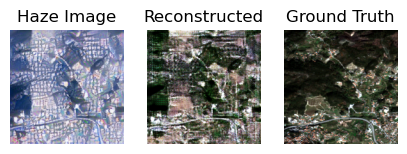

1/1 [==============================] - 0s 27ms/step


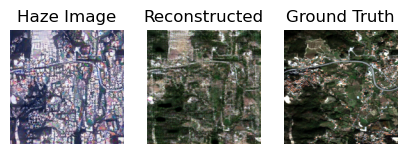

1/1 [==============================] - 0s 27ms/step


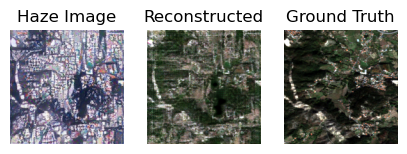

1/1 [==============================] - 0s 26ms/step


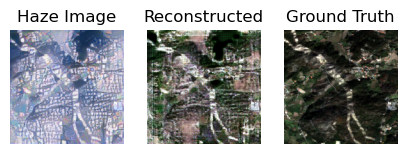

1/1 [==============================] - 0s 25ms/step


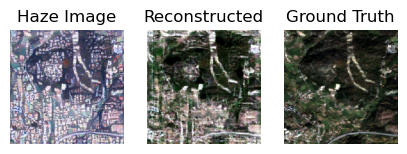

1/1 [==============================] - 0s 25ms/step


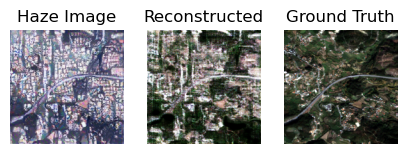

1/1 [==============================] - 0s 114ms/step


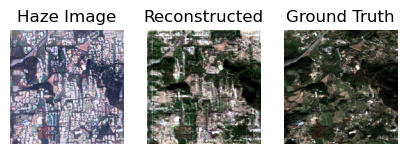

1/1 [==============================] - 0s 31ms/step


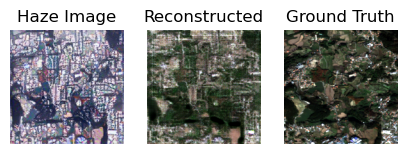

1/1 [==============================] - 0s 33ms/step


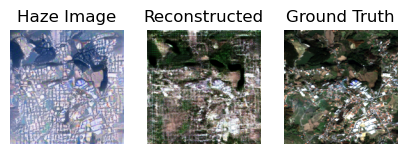

1/1 [==============================] - 0s 33ms/step


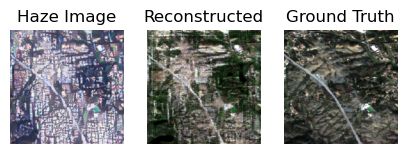

1/1 [==============================] - 0s 50ms/step


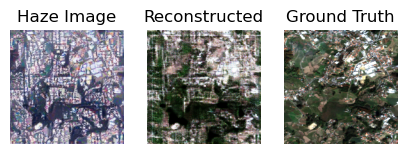

1/1 [==============================] - 0s 33ms/step


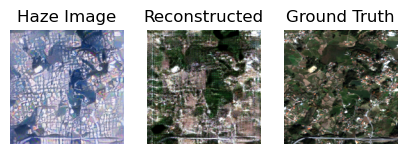

1/1 [==============================] - 0s 32ms/step


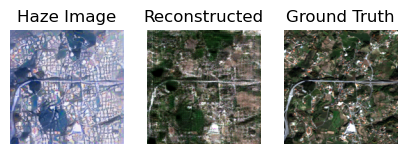

1/1 [==============================] - 0s 33ms/step


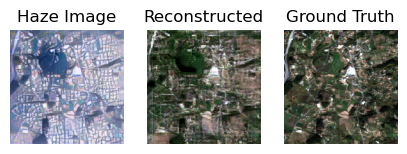

1/1 [==============================] - 0s 34ms/step


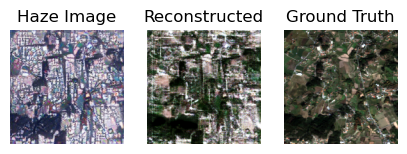

1/1 [==============================] - 0s 32ms/step


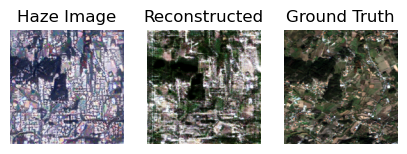

1/1 [==============================] - 0s 32ms/step


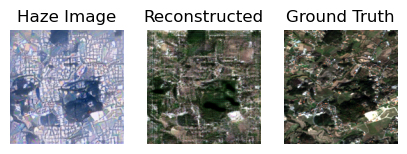

1/1 [==============================] - 0s 35ms/step


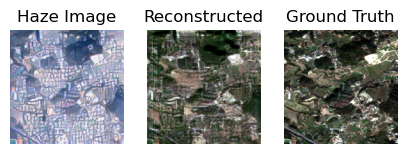

1/1 [==============================] - 0s 32ms/step


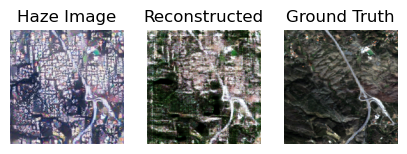

1/1 [==============================] - 0s 32ms/step


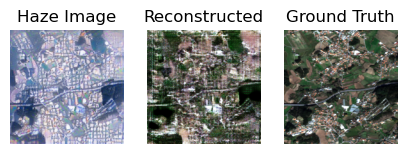

1/1 [==============================] - 0s 34ms/step


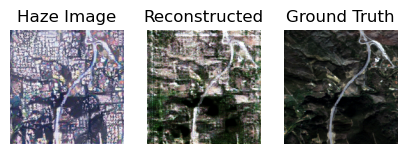

1/1 [==============================] - 0s 32ms/step


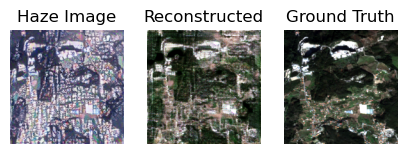

1/1 [==============================] - 0s 32ms/step


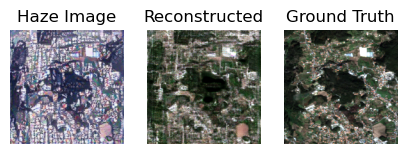

1/1 [==============================] - 0s 34ms/step


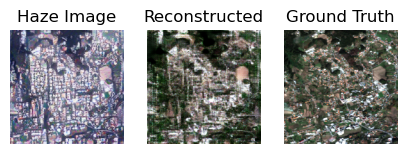

1/1 [==============================] - 0s 33ms/step


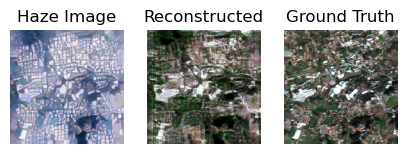

1/1 [==============================] - 0s 33ms/step


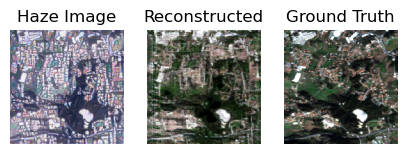

1/1 [==============================] - 0s 33ms/step


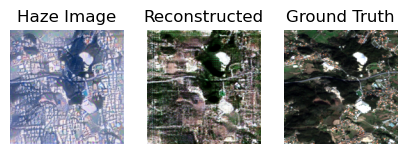

1/1 [==============================] - 0s 33ms/step


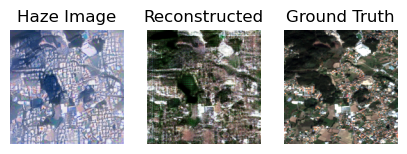

1/1 [==============================] - 0s 33ms/step


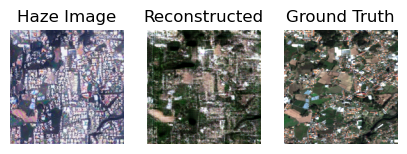

1/1 [==============================] - 0s 34ms/step


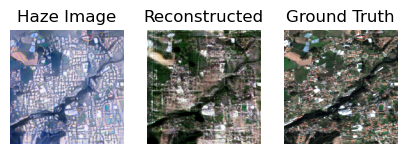

1/1 [==============================] - 0s 33ms/step


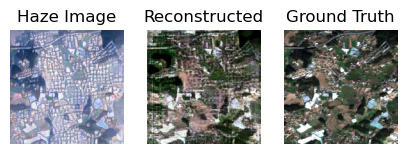

1/1 [==============================] - 0s 34ms/step


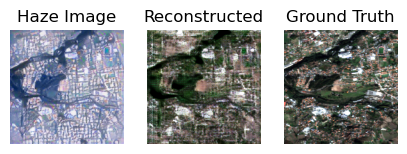

1/1 [==============================] - 0s 33ms/step


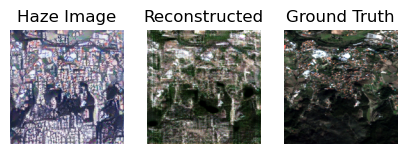

1/1 [==============================] - 0s 32ms/step


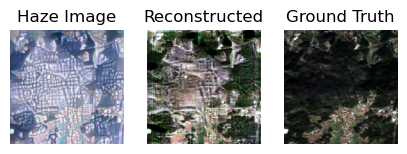

1/1 [==============================] - 0s 35ms/step


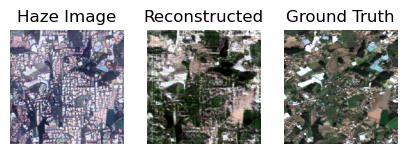

1/1 [==============================] - 0s 34ms/step


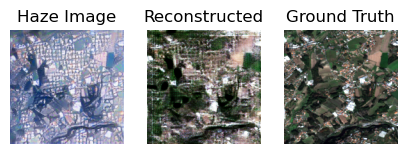

1/1 [==============================] - 0s 32ms/step


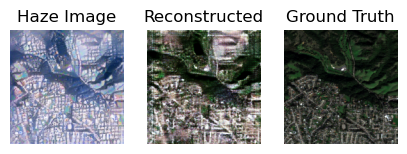

1/1 [==============================] - 0s 34ms/step


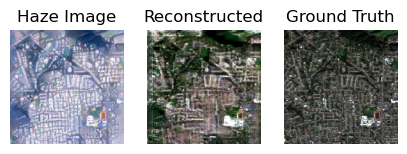

1/1 [==============================] - 0s 33ms/step


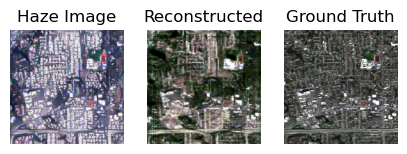

1/1 [==============================] - 0s 34ms/step


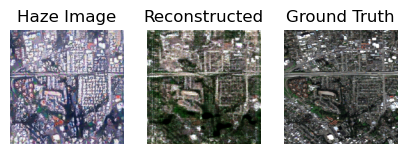

1/1 [==============================] - 0s 33ms/step


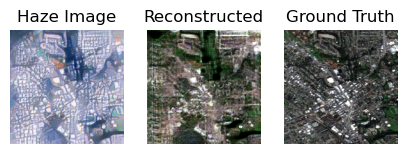

1/1 [==============================] - 0s 34ms/step


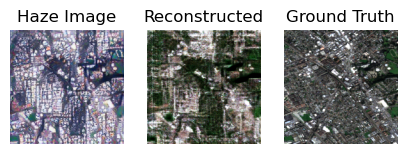

1/1 [==============================] - 0s 32ms/step


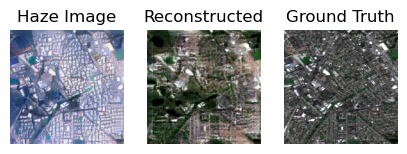

1/1 [==============================] - 0s 65ms/step


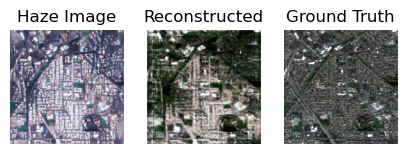

1/1 [==============================] - 0s 36ms/step


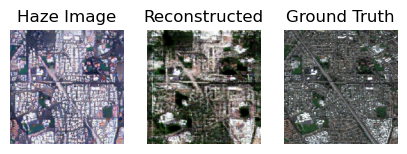

1/1 [==============================] - 0s 33ms/step


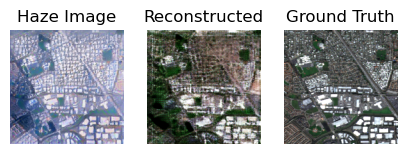

1/1 [==============================] - 0s 33ms/step


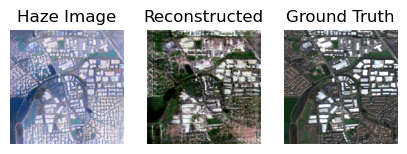

1/1 [==============================] - 0s 33ms/step


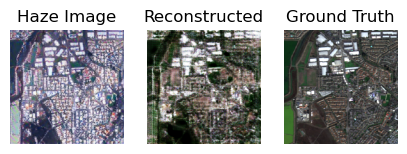

1/1 [==============================] - 0s 35ms/step


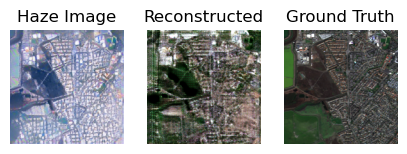

1/1 [==============================] - 0s 32ms/step


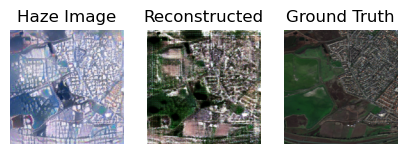

In [43]:
ssim_list = []
psnr_list = []

for i in range(len(H_test_data)):  
    H_test = H_test_data[np.array([i])]
    C_test = C_test_data[np.array([i])]
    R_test = model_HtoC.predict(H_test)
    
    H_test = (H_test + 1) / 2.0
    R_test = (R_test + 1) / 2.0
    C_test = (C_test + 1) / 2.0
    
    ## ssim
    ssim_evaluation(C_test[0], R_test[0])
    
    ## psnr
    psnr_evaluation(C_test[0], R_test[0])
    
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(5, 10))
    ax1.imshow(H_test[0])
    ax1.set_title('Haze Image')
    ax1.axis('off')

    ax2.imshow(R_test[0])
    ax2.set_title('Reconstructed')
    ax2.axis('off')
    
    ax3.imshow(C_test[0])
    ax3.set_title('Ground Truth')
    ax3.axis('off')
    plt.show()
    plt.close()

In [44]:
import statistics

ssim_mean = statistics.mean(ssim_list)
psnr_mean = statistics.mean(psnr_list)

print(ssim_mean)
print(psnr_mean)

0.4679974
14.45648468935385
